<a href="https://colab.research.google.com/github/Obiechina14/Plant_Classification/blob/main/plant_disease_classifier_with_mobilenetv2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kaggle

In [2]:
#Authentication fof my Kaggle account
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 66 bytes


In [3]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
100% 2.69G/2.70G [00:14<00:00, 219MB/s]
100% 2.70G/2.70G [00:14<00:00, 203MB/s]


In [4]:
import zipfile
import os

# Assuming the downloaded file is named "new-plant-diseases-dataset.zip"
zip_file_path = "new-plant-diseases-dataset.zip"
extract_directory = os.getcwd()  # Extracts to the current working directory

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_directory)

print(f"Data extracted to: {extract_directory}")

Data extracted to: /content


In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers  import Concatenate
from tensorflow.keras.layers import AveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
from keras.preprocessing import image
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
import urllib.request
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score
from keras.layers import Input, Add, Dense,GlobalAvgPool2D, Concatenate, AvgPool2D, Dropout, ReLU, Activation, MaxPool2D, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop, Adam

# Read Data

In [6]:
train_dir = "/content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/train"
size=224
from tensorflow.keras.applications.mobilenet_v2 import  preprocess_input

traindata_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=164,
                      target_size=(size,size),
                      subset="training",
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=True)

Found 63282 images belonging to 38 classes.


In [7]:
validdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,
                      batch_size=164,
                      target_size=(224,224),
                      subset='validation',
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=False)

Found 7013 images belonging to 38 classes.


In [8]:
test_dir =   "/content/new plant diseases dataset(augmented)/New Plant Diseases Dataset(Augmented)/valid/"
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
).flow_from_directory(test_dir,
                      batch_size=164,
                      target_size=(224,224),
                      color_mode='rgb', #"rgb", "rgba", or "grayscale"
                      class_mode='categorical',  # Use 'binary', 'sparse','categorical' or None as needed
                      shuffle=False)

Found 17572 images belonging to 38 classes.


# Visualize Images

In [9]:
classes = os.listdir(train_dir)
print(f"Classes found: {classes}")
print(f"Number of classes: {len(classes)}")

# Count images in each class
class_counts = {cls: len(os.listdir(os.path.join(train_dir, cls))) for cls in classes}

Classes found: ['Corn_(maize)___Common_rust_', 'Tomato___Leaf_Mold', 'Squash___Powdery_mildew', 'Potato___Late_blight', 'Pepper,_bell___Bacterial_spot', 'Strawberry___Leaf_scorch', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Cherry_(including_sour)___healthy', 'Apple___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Tomato___Septoria_leaf_spot', 'Peach___Bacterial_spot', 'Blueberry___healthy', 'Soybean___healthy', 'Tomato___healthy', 'Tomato___Target_Spot', 'Orange___Haunglongbing_(Citrus_greening)', 'Raspberry___healthy', 'Peach___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Strawberry___healthy', 'Tomato___Early_blight', 'Apple___Apple_scab', 'Corn_(maize)___healthy', 'Tomato___Late_blight', 'Potato___Early_blight', 'Grape___Black_rot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Pepper,_bell___healthy', 'Tomato___Toma

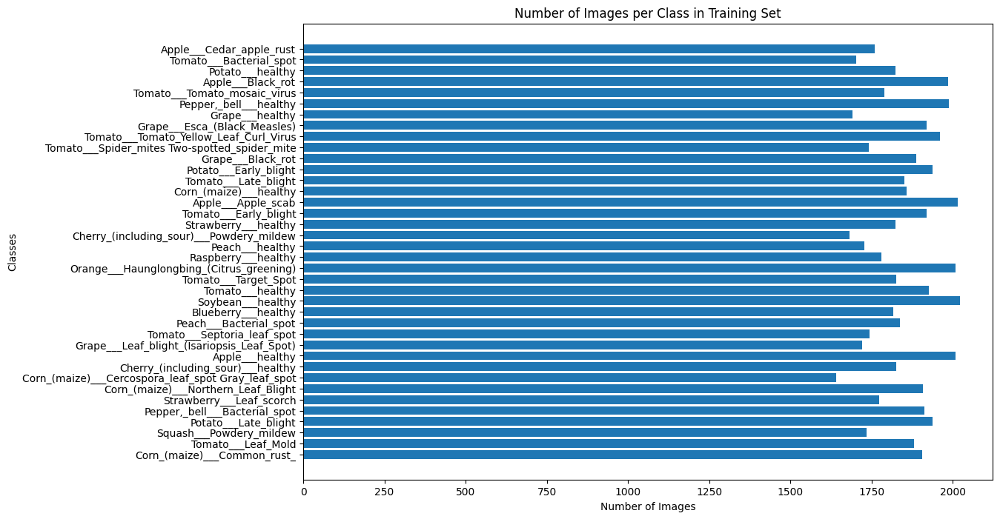

In [10]:
# Display a bar plot of the image count per class
plt.figure(figsize=(12, 8))
plt.barh(list(class_counts.keys()), list(class_counts.values()))
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Number of Images per Class in Training Set")
plt.show()

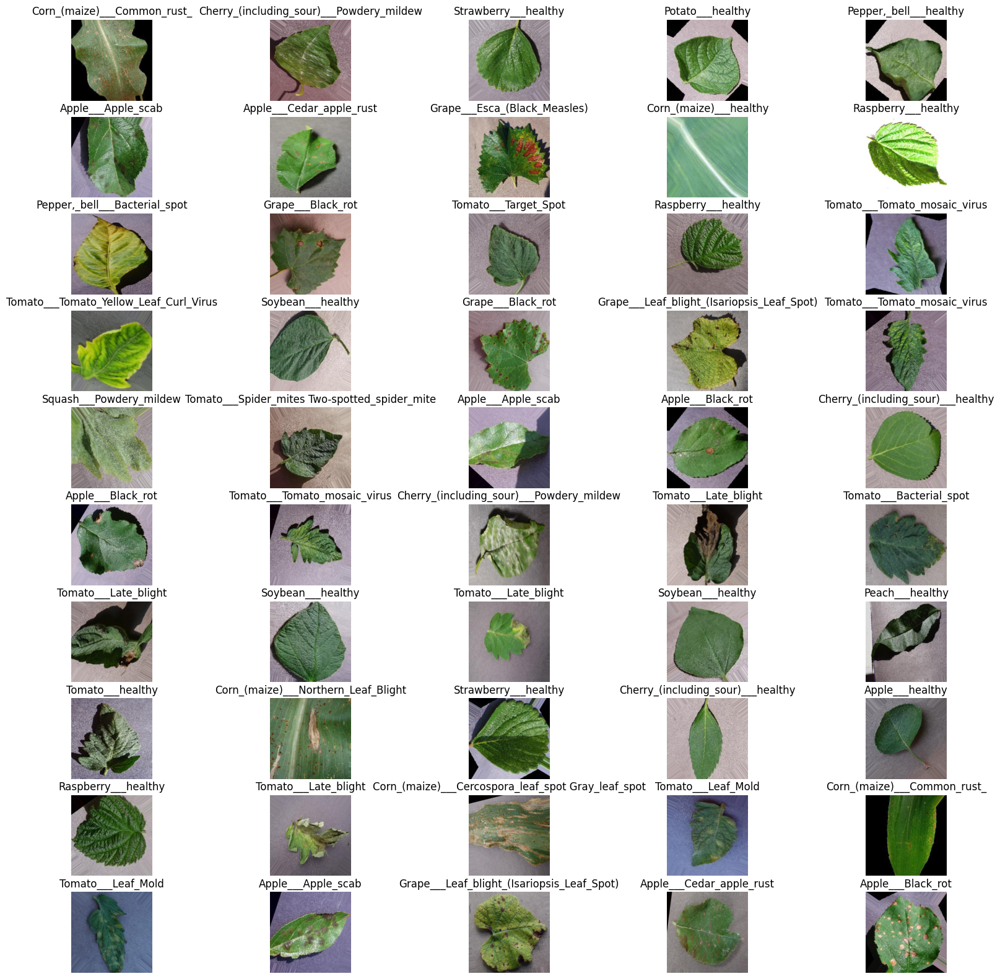

In [11]:
# Get a batch of images and labels from the train_generator
images, labels = next(traindata_generator)  # Get the next batch (128 images in this case)

# Reverse the class_indices dictionary to get a mapping from index to class name
class_labels = {v: k for k, v in traindata_generator.class_indices.items()}

# Convert one-hot encoded labels back to the index form (if using categorical mode)
label_indices = np.argmax(labels, axis=1)

# If you want to shuffle the batch and display 50 random images
random_indices = np.random.choice(len(images), 50, replace=False)  # Choose 50 random indices

# Plot 50 random images with labels
plt.figure(figsize=(20, 20))
for i, idx in enumerate(random_indices):
    plt.subplot(10, 5, i + 1)  # Create a grid of 5 rows and 10 columns
    plt.imshow(images[idx])
    plt.title(class_labels[label_indices[idx]])  # Show the label as the title
    plt.axis('off')  # Hide the axis

plt.show()

number_class

# Create MobileNetV2 Model

In [12]:

from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dropout,Flatten,Dense,GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.models import Model
from tensorflow.keras import metrics
import keras

In [13]:
# detect and init the TPU
tpu = tf.distribute.cluster_resolver.TPUClusterResolver()

# instantiate a distribution strategy
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

# instantiating the model in the strategy scope creates the model on the TPU
with tpu_strategy.scope():

    base_model=MobileNetV2(input_shape=(224,224,3),weights='imagenet',include_top=False)
    base_model.trainable = False

    inputs = keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dropout(0.2)(x)
    outputs = keras.layers.Dense(38, activation="softmax")(x)
    mobilenet_model = keras.Model(inputs, outputs, name='mobilenet_model')
    mobilenet_model.summary()

    mobilenet_model.compile(optimizer='adam',loss='categorical_crossentropy',
                        metrics=['accuracy',metrics.Recall(),metrics.Precision()])


9406464/9406464 [==============================] - 0s 0us/step
Model: "mobilenet_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 38)                48678     
                                                      

In [15]:

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=15, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]

In [16]:
history = mobilenet_model.fit(traindata_generator,
                    epochs          = 30,
                    batch_size=None,
                    validation_data = validdata_generator,
                    callbacks = callbacks
                    )

Epoch 1/30
386/386 [==============================] - 695s 2s/step - loss: 0.8377 - accuracy: 0.7726 - recall: 0.6292 - precision: 0.9286 - val_loss: 0.4495 - val_accuracy: 0.8680 - val_recall: 0.7988 - val_precision: 0.9309 - lr: 0.0010
Epoch 2/30
386/386 [==============================] - 673s 2s/step - loss: 0.3577 - accuracy: 0.8927 - recall: 0.8458 - precision: 0.9386 - val_loss: 0.3546 - val_accuracy: 0.8892 - val_recall: 0.8464 - val_precision: 0.9355 - lr: 0.0010
Epoch 3/30
386/386 [==============================] - 677s 2s/step - loss: 0.2890 - accuracy: 0.9117 - recall: 0.8795 - precision: 0.9445 - val_loss: 0.3093 - val_accuracy: 0.9019 - val_recall: 0.8661 - val_precision: 0.9352 - lr: 0.0010
Epoch 4/30
386/386 [==============================] - 680s 2s/step - loss: 0.2586 - accuracy: 0.9186 - recall: 0.8915 - precision: 0.9461 - val_loss: 0.2691 - val_accuracy: 0.9153 - val_recall: 0.8864 - val_precision: 0.9435 - lr: 0.0010
Epoch 5/30
386/386 [============================

# Summarize History For Accuracy

In [17]:
#plotting training values
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

precision = history.history['precision']
val_precision = history.history['val_precision']

recall =history.history['recall']
val_recall =history.history['val_recall']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

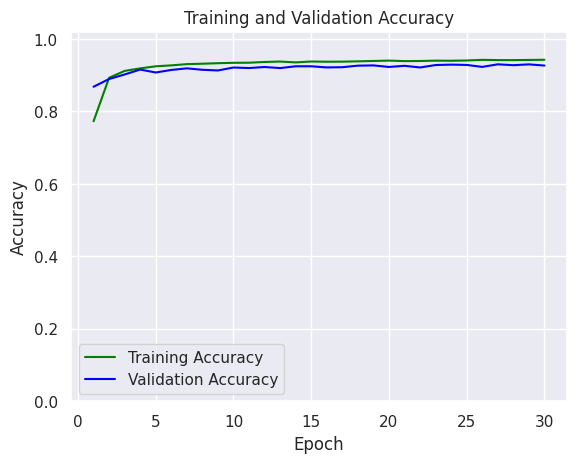

In [18]:
#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0,1.02)
plt.show()

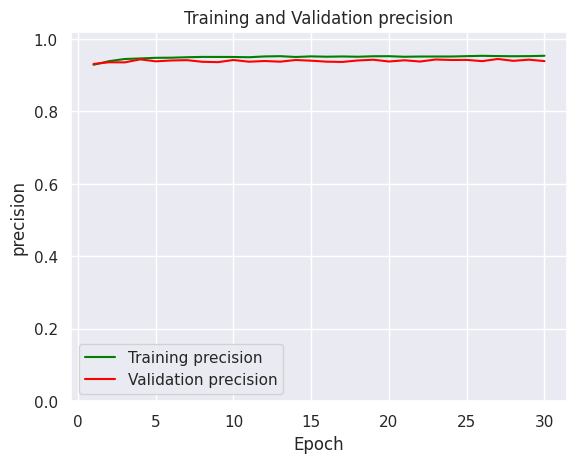

In [19]:
plt.figure()
#precision plot
plt.plot(epochs, precision, color='green', label='Training precision')
plt.plot(epochs, val_precision, color='red', label='Validation precision')
plt.title('Training and Validation precision')
plt.xlabel('Epoch')
plt.ylabel('precision')
plt.legend()
plt.ylim(0,1.02)
plt.show()

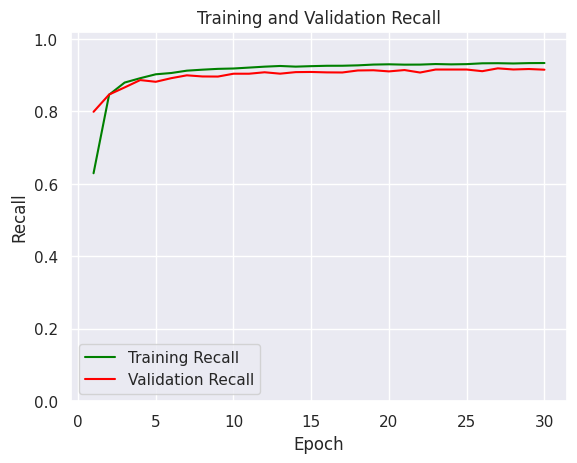

In [20]:
plt.figure()
#recall plot
plt.plot(epochs, recall, color='green', label='Training Recall')
plt.plot(epochs, val_recall, color='red', label='Validation Recall')
plt.title('Training and Validation Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()
plt.ylim(0,1.02)
plt.show()

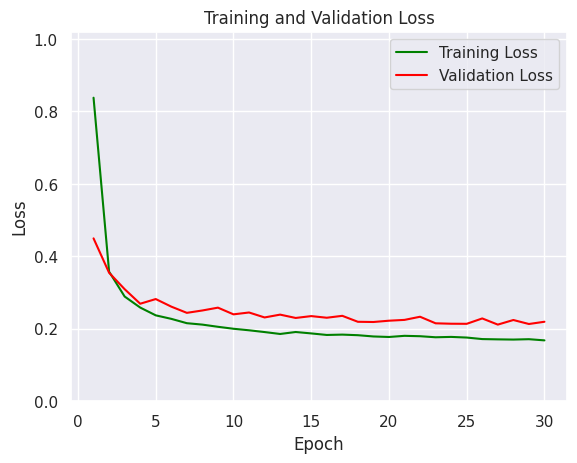

In [21]:
plt.figure()
#loss plot
plt.plot(epochs, loss, color='green', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.ylim(0,1.02)
plt.show()

In [22]:
# Evaluate the model
model_evaluate = mobilenet_model.evaluate(test_generator)
print("Loss     : ",model_evaluate[0])
print("Accuracy : ",model_evaluate[1])
print("Precision  : ",model_evaluate[2])
print("Recall : ",model_evaluate[3])

108/108 [==============================] - 44s 395ms/step - loss: 0.2003 - accuracy: 0.9336 - recall: 0.9228 - precision: 0.9460
Loss     :  0.20031782984733582
Accuracy :  0.9336444139480591
Precision  :  0.9228317737579346
Recall :  0.9460358023643494


In [23]:
predictions = mobilenet_model.predict(test_generator)

108/108 [==============================] - 49s 367ms/step


In [24]:
l = test_generator.class_indices.keys()
classnames=[]
for i in l:
   classnames.append(i)
classnames

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [32]:
def predictor(model, test_gen):
    classes = list(test_gen.class_indices.keys())

    preds = model.predict(test_gen, verbose=1)

    errors = 0
    pred_indices = []

    test_count = len(preds)

    for i, p in enumerate(preds):
        pred_index = np.argmax(p)
        pred_indices.append(pred_index)

        true_index = test_gen.labels[i]

        if pred_index != true_index:
            errors += 1

    accuracy = (test_count - errors) * 100 / test_count

    ytrue = np.array(test_gen.labels, dtype='int')
    ypred = np.array(pred_indices, dtype='int')

    f1score = f1_score(ytrue, ypred, average='weighted') * 100

    msg = f'There were {errors} errors in {test_count} tests for an accuracy of {accuracy:6.2f} and an F1 score of {f1score:6.2f}'

    print(msg)

    cm = confusion_matrix(ytrue, ypred)

    # plot the confusion matrix
    plt.figure(figsize=(20, 20))
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(len(classes)) + .5, classes, rotation=90)
    plt.yticks(np.arange(len(classes)) + .5, classes, rotation=0)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()

    clr = classification_report(ytrue, ypred, target_names=classes, digits=4)  # create classification report
    print("Classification Report:\n----------------------\n", clr)

108/108 [==============================] - 37s 333ms/step
There were 1166 errors in 17572 tests for an accuracy of  93.36 and an F1 score of  93.32


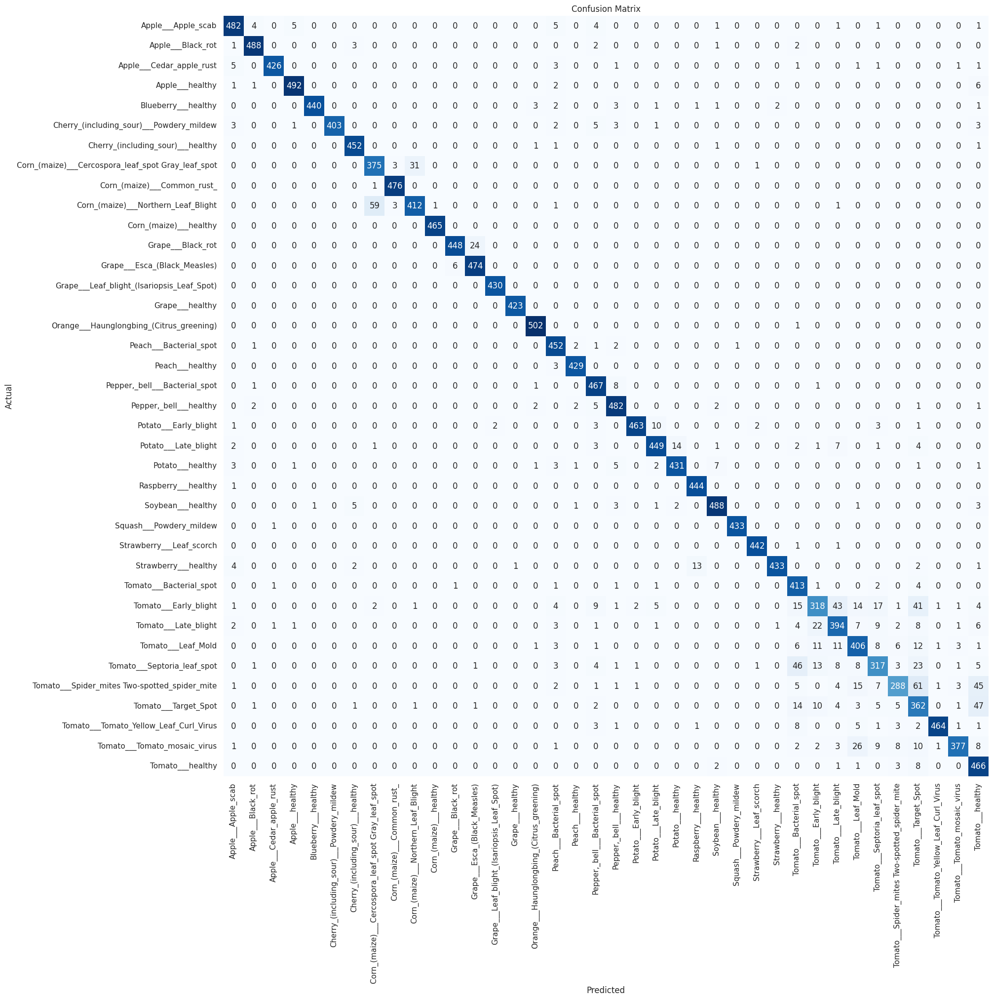

Classification Report:
----------------------
                                                     precision    recall  f1-score   support

                                Apple___Apple_scab     0.9488    0.9563    0.9526       504
                                 Apple___Black_rot     0.9780    0.9819    0.9799       497
                          Apple___Cedar_apple_rust     0.9930    0.9682    0.9804       440
                                   Apple___healthy     0.9840    0.9801    0.9820       502
                               Blueberry___healthy     0.9977    0.9692    0.9832       454
          Cherry_(including_sour)___Powdery_mildew     1.0000    0.9572    0.9782       421
                 Cherry_(including_sour)___healthy     0.9762    0.9912    0.9837       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot     0.8562    0.9146    0.8844       410
                       Corn_(maize)___Common_rust_     0.9876    0.9979    0.9927       477
               Corn_(maize)___No

In [34]:
predictor(mobilenet_model, m)

# ROC AUC Score

In [31]:
print("ROC AUC Score is {}".format(roc_auc_score(true_data, pred,multi_class='ovr')))

NameError: name 'true_data' is not defined

# Save And Load Model

In [26]:
mobilenet_model.save('mobilenetv2_plantdiseases.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [27]:
mobilenet_model.save('mobilenetv2_plantdiseases.keras')

In [28]:

model = load_model('mobilenetv2_plantdiseases.keras')


# Model Prediction

NameError: name 'final_predict' is not defined

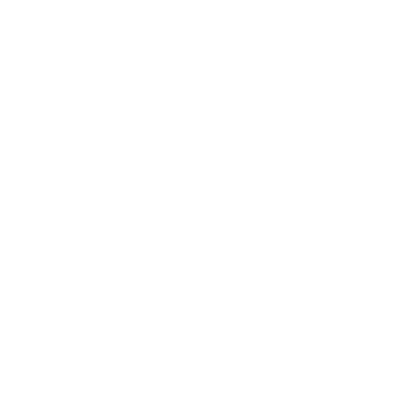

In [36]:
class_name = list(test_generator.class_indices.keys())

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")

    true_label = class_name[test_generator.classes[i]]
    predicted_label = class_name[final_predict[i]]

    color="green"
    if true_label != predicted_label:
        color="red"

    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_generator.filepaths[i]))
plt.show()

108/108 [==============================] - 144s 1s/step


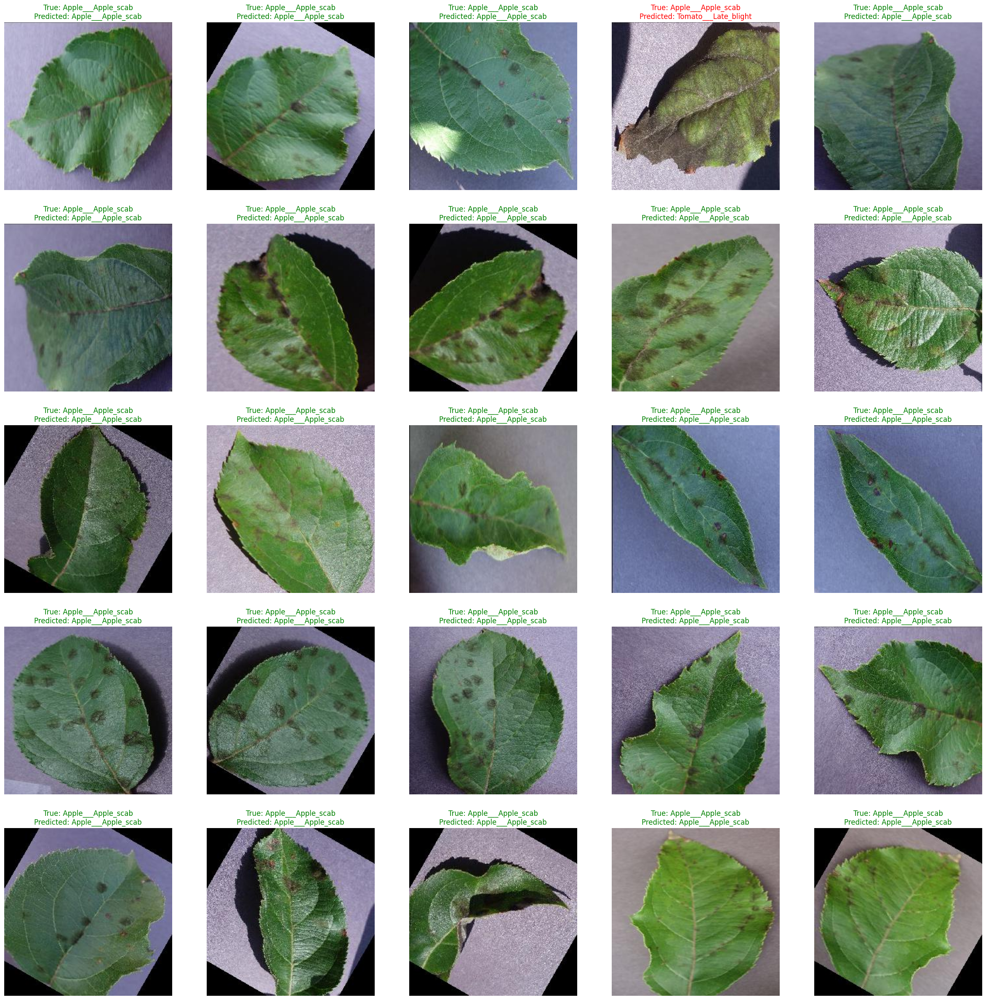

In [37]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

model = load_model('mobilenetv2_plantdiseases.keras')
class_name = list(test_generator.class_indices.keys())

# Predict using the model
final_predict = model.predict(test_generator).argmax(axis=1) # This line is added

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")

    true_label = class_name[test_generator.classes[i]]
    predicted_label = class_name[final_predict[i]] # Now final_predict is defined and can be used

    color="green"
    if true_label != predicted_label:
        color="red"

    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_generator.filepaths[i]))
plt.show()

# Predict Custom Data

In [ ]:

from tensorflow.keras.preprocessing import image
# Set the figure size for the plot
plt.figure(figsize=(15, 15))

# Load the trained model
# model = load_model('/kaggle/working/my_model.h5')

# Load and preprocess the image
img_path = '/kaggle/input/new-plant-diseases-dataset/test/test/AppleCedarRust4.JPG'
img = image.load_img(img_path, target_size=(224, 224))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

# Predict the class probabilities
probs = model.predict(img)[0]

# Get the predicted class index and name
pred_class_prob = np.argmax(probs)
pred_class_name = class_names[pred_class_prob]

# Print the predicted class name and probability
print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

# Display the image with the predicted class and probability
plt.imshow(img[0]/255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


# Read Images From Online

In [ ]:

# Set the figure size for the plot
plt.figure(figsize=(15, 15))

# Load the trained model
# model = load_model('/kaggle/working/my_model.h5')

# Define the image URL
img_url = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoGCBUVExcTFRUYGBcZGhwcGhoZGxwgJBwhHx0cHyMgISAcHysjHx0oIBshJDUkKSwuMjIyGiE3PDcxOysxMi4BCwsLDw4PHRERHS4oISgxMTMxLjExMTExMTExMTExMTExMS4xMTExMTExMTExMTExMTExMTExMTExMTExMTExMf/AABEIALkBEAMBIgACEQEDEQH/xAAcAAACAwEBAQEAAAAAAAAAAAAFBgMEBwIBAAj/xAA/EAACAQIEAwYCCAMIAwEBAAABAhEDIQAEEjEFQVEGEyJhcYEykQcUI0JSobHRYsHwFTM0coKy4fFDc8KSNf/EABkBAAMBAQEAAAAAAAAAAAAAAAECAwQABf/EACwRAAICAgIBAwQBAwUAAAAAAAECABEDIRIxQSJRYQQTMnGRocHwFDNCgbH/2gAMAwEAAhEDEQA/AOuN9nTdlsPLAThmSL1hRk6SfFjQ8xSqMFKuqNzm4wsZ9e6q/aFSZkMki4x5iORuQbGAY78Dyq06cKI02GEn6ROKKrd2TDkz7YLZvtZ3OXQmnrqMJE7AcicIHH3bM1mrusauQ5RhsKnnyPUDGtQnwPjsWJt54qcXRKpNRIJ5jAXJcKrVG0U0ZiN4/fbDx2c7G1lio4U/wEmB5kjf0xoegbuctxTy3CqlYzSSOTapCn3iJwVp9iySpKESblSLftJxpa5OmtPUV8VNtJHlPIdPMYIZKpTI1qwYAWM3HkR++BZOxCGI1Fvstw+lkaTl7vUA8DwAY6eeJuPZUVx9tJTZUU29+W3MYJ8Wpd4NOkat1PL2HUb+2B+aouF8Qvpg2sDFm98URB3UR3Y+Zl3bTsucvXIpy1Nj4PKbgT+WPuE9mpPjXURczt+W5xoFCnSei1Sp4m7whQTcRuT5Wxep5dIBmFkEnoBhmLXXiT5MRK3CuGLQpLTA01XClyYEcwoHIDn1IwWXhFDMN9smsKJWSQOQ5ESLD5YGrWFWuNIPhJN/Pa/KcX3zYpuArang623A/hAkQBhVYMNTgKM+q5elk5FKmqa2UBV3Y9N7wt8D+1OWLrSqhA2moA6ECSpUht+hgx5YMZeutQ+LuyeQYEMvuD+mFTtP2jRMx3bLoCrdZv0mCf8AnAdTyDXKXqX37P0aqxpS8AQNvcXm2FbifY7ujrpszxfSRNvUb4c8jWpd19YDAU+dQGNJ2v0wWpsDRPiBJFnEXG1uU4gcjo2uvacFmV0siz20zivX4O4N1IGG3jmVOXHeo3xNGkj8x8sCP7SqkxAM2iOuLq5amEtjUXcTuL5RgyqqksTAAEknyAwLrKyMVYEEWINiPbGv5TKr3wcIpKD4jO5HLoQZ5Yzrtx3f1uqEGxEx+LSJ/PFkzB9QMwZtQMMyQpjFM0qhvJODnZ7hgqv4thy64cM/wWmEGlQBGCzhehAHAmc8NqVKbhgSIxqeXrA5daqCSwjCJn8qQYEG8CMP2UyhTL06WxAv79MSc8iIG3uA6OUOrWznWDNsSNTqhzWXSWidsEctwXmXMYKFqdMGBNrkxAwGBklO4rUiahZqhMzifhOXTv0MEkTc4G8S7QsahCABQY2388T8C4zU79FtpYwZAweJVaqH/lcGZXgTZjPupJ7tSWeCdhy9zjR/7NpsCrguoChNPhUQbeo5XOKvBGQZhhpBL7QQLgE894I2xe4lmmePhVXj4ZNz1npvjhZNe0oxsXAg4czeOBoV9MWuRuLHlIvgnQyg7sypg7HqRGw998F6dGmiAFgOUESYjcjFenRZtjCn8+kfLFi2tyJUeJ3WreFWgyQPTzwk8X4wVrsjRUSZ0ndfQ4H9qe0zZoImXNRAs7GNQIHLywpPnnBIJMzed8ZMeAEEnuV9XiaNnqi1EV1+GAojlHI4tcKoZaPtjUVQQfBp256pEx6Xwldle0PdNoqXptvP88HO1vD6z0jUyza6REsi7j9xiJUqwVtfPvH4E7G5o/Ba2Qd9FKogJgqkaT/pkCfzwczFRUbTed7kW9hc4yz6GMrUrM5qLNKlBRmF1a9hg79IfbQUHCUoaoLeg9ccGVX4Ab/mOcfpsQ5x7PeBU0nU7i+krZee8m8fPHFXJIQNLNTcqYK2gjf8j+eAfC+MHNCnWVrCxB3DfeTa8bz6YPZLMUywpsSCBBBNxO+++24xejdzMx8GWBnWWDNNrCQqSxt5f9Yl/tAlSXpqF6HePO8DFMOqwBJJBW28Wi8YX+1XE1ogJU8OoW3vETf3GLruLZhWkmVqEkI3n3ZkE7fe3OKIylAZi9abWpVGOgGeoty2OFTN9slCslIQSpXWZBAO+kcvXCxQzWswztv1wpxkxgfcTVuLZoUrlYLC7KBB5WItYYAVOLFSG75481V56zPiwL4PxmpSU03Pe0jvTe9vI9cdcT4OtRPrGTc1KQu9I3en77sv5jCKvE11/ecVvYjLluMUyQwqUmUXJDqpnoEJke8YX+3uVFd2roFdYUErdlgbuB+othbqgG5X98Gew+Qq1Myq0p0/+Sfh0HfV5Rywx0LJirs0IL7O9os1lnCUwKi3XuyJ1/wnr8sadTqqpK06YCiPCxLBTF1XooJ2H/XeQymTyZc0EVqs/GxnTbZeajlgZWztOhRbM1LhDKj8TfdHufYb4gciswAEq4IFXD3GOEVKsrpkAWuLeg9cLByD0qg1KwINvCd+W/nha7LcfqPUK1HYmox2J8JYyCPTDtSztdFcu7IAIUs0qTO41eWGUlbWtS6OFXcl4zVqZHJ96UBqMQFJv4jza4xj2eUu2q7OzTtdifIc8bjmqVPN0AKgUgQeomx/0+uBfZrs4mTFSqaeqqx8DGDoUclOwnrvjsbBAakbEz7h+UzFKH7mqBz8DftgtxTjE01VQSxGHEZoC9RrmfCtyfKxsPPFKvk6dVCaaaanIkR7bRjjksipOwfyijwDhOlxmK3wgyFJ5+mGHN8YpAF2qADphZz1YqzKzSFJm9pHTCpns21U6dlxVFN8jD+WvEds12yoAwpZsAuJcZrVzpU6UPJennhWzOXKG+2DnZijKFztMewxQgKLEpxULcs5bLi0wo/E2DXC81ldQVEYMPvsALxuL88VlIa20cuuCOX4epGoxFvPCOzCjIAz3h2aqNmUAUsSYiBPqOWHqougkgAaAAwaAQfLSY254U+zufVMyyssgoVXlFxceeGYlXrMGEAQscySJvzi+OBJMYfjPsuW1irUCsrA6ZvvuSCN+hwQyX2lXSABAt5W/Xpgbm6umEVFB0jSFMyQPywT7M0wuoneAST1MYa7g8zL+wXD111Kb/3lNvmDcYr/AEl8JSm9OtTAHeAhgBzF5x2nElGfpmk8d4vduRtI+Hf5Y77R1aubrLT0FEp7Tv5k4zryGTkfMsdbiWtInDB2V7Q1Mmwk6qfNenphqyXZGiaUGS0fFO2ETjPDmpVXpsCQpsYMH3xVuGUFWhVyDqfoXh+aptkjmKQADUywgReDv5zj86Z/Ol6jO92JMk42f6Icx3nCmRjZDUUz0kn9MKHZ/sPorjMVWV6YZmFODfeJnljFgZcTsD2NfuWc3Vz36MqdRadQuumk5DA3JJjTZAZKn8XkMOveI+iFDVFNjBBIG4GoyRvacU2zCuV1Ko0kLYHwgbCQBzO2OqlAIZYMD11Hl943tz28sXVi3qOpjyH1ahzLOC6E/cBsPOw/TAbtfkBmcrUU0y1QHXSKmPG3hA/y3vNhAwT4TmZUqYJC2dYkjzgb+mJqVVV1kMEVVEu3K3K92w33ADd7i0RMRzvCa1ME1KTKsxPIH1BwN2Nsatwvhj1CxdyKTFtJK3qIb6vIbCTuTgnluzORoEP3Kuxv9pLHf8JOkGTsByxQ5xdeY4PkzKOGvUayozj+EEx8hg7lhWyjLX0tT1kxqtOmJEb8+Yw+vmS5hBpE2UQoAteBEDcnGa9sOL97WIRppUxpQ8m5s3udvIDDXz0YoO9Q/VyNHNkZiiQl/tqY68yo5E9NueGTguY7ui1DLU+7DTqc3M7Ak87wMBOyfBjSyBzFQhe9IeLyEAOkDzJM+kYF5rtRUCslJBTBBUPJLQeY5A4yFXe1U2BKE8TcuZLhzU6pJzVBW1Q9ySYO0FbEYl7U8LzFVIp6KlNmhQrgxzgLaTbCcjE3Mm9ycPXZjNAqUJ8Qjuw1heSxn8VsWOMr6hVj4i8x1KXYnICnQYPS01tbAsykOsQIBItYfng//ZrOpZhYDwixgfoTzOClHOHwgkEEAw39W9sT1aiVFAXw+RFp8oOFU2bPmK49ov1cjUp1FqLTZ20kEEwOknT+lsFuG5utZRSIBiUe4PmD1jHOZNVCqLpk9Pnb9MS0gjU2apU1ODA0yIjks3Pr1wxQg6ihqk9bK0nVigKNBlTuBzidxhW4xl2TWUDOCsgrM/LBuvpB1osm2o6pI6898Rh9ZLpIqMLcgw5gjk364TgA1iMGB1Ml4g+usifdO+LGYyAp20j164540g+u1GQFRzVgRpbmL/1fBItrpBG3AlTijkgipQkVFjiKg2xPw/NulPQu2q1tsQ5kEEziThw8V9hjSBqKTqFMpYyxucG8tWamsSCJ2wGpkAyR6Ynoub6toth+IIqRuHOB5RKmco6tiSWAm4ANrXuYGGvOOiVGD0wDFjY6RyEi8+vPCZ2Xz/2yOFLEyoA3vYbecYae0VFRUpCwH3hJ5XNzF5xmf0mpVdrI8u2moKrWtYDl/wAnDBklii1QwNRt7D9yMJHEM741AhQeUzubn1OHjPVlXK0yCCCsfzwA2jOmLZbgGZqAtTpPK+JSQRcXm/phyyvDqlalSzNIT3q6qnVWFiPmNsE+xfHO/pPUqnxJYqB8gMBeCZw0KuZyssAHNWkOWl9x88R5O5NjYl2KhTPaXEawfQxKqLeZ/wCMS57jVGmrGoykhTCtBJ8oxR7a53RTpsxKksRI52v7YT6vCWrzUp1A7G8EwcHgDttSaAkzRvod4qa65ih3aIrfhBHxAxzwZ+tIKjUGdpHhLASB6XF8AfoOyFSmMyzoVMqPEI2BwGq8YFPidWnUYLT70EE8jb8sZAOWdlXrv/yaci+gGOfEs1SpIGYoEUgMzrt5+p98A37e5To5JIECnpIvclg0Ec9sR9uqyPlyodXZ2CrBmbzPtgPwfsYKoUEtJG4/qw88beSqKaYxXmOmTzmXUd+alOmbEBdRY+ZPhHsBj3tLmKZp96ZcOQaKBIAaAZJm0G8nlywKfs5Sp00pNmGYqpgKoYAzIBMyYnmB5YJ9lsiyF6LgvTHiWo9kDiCukHcdbcjOMeRkuwY6AmxCtCmxJfZTGkGBYXjTaBf8sQ1OI011qzqzLMohpFjuYA1Ezfy3wr1e1Gac9yADUkqw03LSRAjlHlhSzrPrqajFQMZI/ECZj3H5YbDgYdtOJBjT2i7YhXWmQ60ogoN1BG7GSWeTJGwA64o5PgtHM1aSo1KCw16HF0ufhkkNsOVicC6WXfOoaToxqKPDURCR6PAj3w1/Rz2bfKUaleqmmoTAU7gAkC3mTPpGLOSqaux4/ccKLuTfShxkIKeWp2A3A5Af1+uEui/uOmPYqZzNVWYBAphtViokgALcsT5YLZns6VK9zUWrIEqbGelrel5xTDxxqFJ33J5dmC2ToIB2xbUEAENEXsf54iD6ZVtxNjuI8sDOPZtkVFW0iW88aeXtJBSx1HHJdoIpsalKpUCCDUp3InbV788Hsq6sKenVpeDrEmNyCDEeXyxj/CuKVaNZa9OoUddiOfkRzU8wcaTwH6RaNXwZkvRcwAyXpzNjzKediPPCOntKHGYw18wVc6iTptY3NtwOmOckgYwC2g3BgefpfB2jxBigddLAybMrBhvYjw/n7Yqs9JtMrAUgeCwIYwZi0i9xzGJcR1cQieJlkZfs7lWg2E+k7g+XninmsnpYKEJY+IQb+UmIkRHzGJeH1AveU3BBLRPPb4xHUXnri/QqzGoaoJBIMGQYm14NjG2CqA6nVETt/wALqSmY0AALFRrSbjSbbmDvhbc+ExuBjVuLUadSm1GqAKezEyJi4hgJEGDbocIbdmHS1SopnbuwXnb0/PphykY9RK4gOfXHnDaigkHmMMmc7NK06KthYhlEq2wBGq0nCeLEg4op8ThsQ4XBETP8scrXIGmbXxS4Y4giZb9MS8yekYopkytGGuzmaNOvSYW01EM/6hh343xAOz1ElwRFhYXkn1jnjMstmvFEb4eK9T7FCBJheXKLx8oxn+oo0RHSwKgvOVjUdZIsdIFrC9rbjDJm80NIX7tMHbyOFHh1aa94AuY8h/1gq9UMxWY1SR5zzxnuqjV5ih2S40tCuAx8DkBvLocG/pDzSpUpVqc608LnkVN4/rrjOQcElzdUppJ1LEeK+NnHdrLFN3DHbjjIrmiqmQlPxf5jv8hhfy+YemQyMVI6YhLcscajg8RVRgKFTbPor4w+ZpNq+KmYI6yLHCh2o7O1audrMqhU1SXcgDbz3wb+gUQ2YvuEI/PEnFcnUzHGKdGqZozqZZgaQCTPWYj3x4iWn1bKhA15mhqKAmD+zHYt+9H2yMNM2DQAeYO3LbGj5HL06K92L2Bn0G5g8+nLCvx3j9HL1wtSoQGuvdqugAE2JmQbRiQ8eEipThiRZnJYL5AbX642FC22N3MWQm+qhl0AYOwC33eCY6C25PyHrj3O1T3VRoJWEAaTcmTt8/ngDVStUYs0+bNZfl09MX+IZ6m1EUhUEArsDuBFj74yZMaLTE7v+Icbd3B1bMigBmBT+1qxT1NMKRI28wJ84xL2S4QKYdqyIzGoWbVB5WPOAdRxFSU1NVGoWemRKt0O4udjHXEC8RzFQtolEGlBTUXJW12jUSABOOtqIU17n48AQkjRIjd9bqIAtOmqryX4Re9o5x1jFPiHGUoLqq1kprNxF552QMWwr5ltC98HL1EYDUTKwLPp9JifIjCd2jzjVKzqLwAfmJxpwcnNE/uIVs7mm5jN0aqLULCotRfCwVgSpsLm4vgXk27qoWpowSPCfCT7gDGf8M47Wy3gUq6Ag6XEgbbGZX2wVTtouolqTXP3XkL5gECTir4nLe8Q4/aNvGaH1pPChNVfEDIvFyP/AM/nhS4v2fqV210HSohOm8oVI+6dQifkMO/Y/iCV6FauutIhdbgCLTIhiOeEbM8SbLZyq9B0dXMspGpTN4ItcdRhsYKnj5jqvEQfl+x+cb/xaVkDWz01W5ixLeLrbFit2IzdMuxplwlwyQdYmJW8nzESMOXCe0WXzFOGKUKiyTqqaf8AUpMBhtY9MEMzn6isDKtpkSv+6NwR6bRh3zFO4ObRF7HcXZNVE13pJJJhdQB80PKd4vfDSKGZRi+tSrMGVgwCuATNrQZ5EDEXGqKVMvUrLpUrpqwAOfhYfNp9sV+zD/WKFTLPykjadLXMehE+oxmyurKXEKj1RgTMO+Yq/ZlDTpKuvVvBBBP3SpXYXsZx1X7W06bFaSFmAMktY33mJJHpi88rTFNaiU6aoF8YktAiSWMG0WjEVLurBRSMjxFQII6zHQbYRMlnkIzAAQbwjtClcxXqGnUn4TBSoCbfGpg8jHriemlNqeqnSAWdLKYsZ2PK4khhY+RGAv0hcFC0DmKKEsuktoNgnN4jba42wm0u1tdaDUPvTK1dRDLcGDyO0e53xtQEi5MJyFiPvaSqqEO1DRTGnVVptqIuPiQgEXgAy2M64xUR69R6YARmJULMesNcTvHnirm+N16p+1qM/rt8hAxD9YXfFlWowVgJx3ppuGHvg0pDLqVtxywFrAPiXJ1dFj8JwxnOvIa7hMIRN5w39l82Sppn7uxP4TuPY/rhUoOGgg2wf4eQjqwiOY8jviGQ2JMXcN8R4GpBZfCWBPuL36YpPlmp09bgLpIIM/P2ODRzQSlqd4hTqnaZwhdoOMNVcKCQmyjr5nzxIY7qMDcTkF8EszXXugoHvgcgxcrglRG2NomqVIvjunT64+Cc+mLJg3wpiEx++g6qRmKqzui29z++DP0i8MqfWqdaixLoy61QNKgmZNtjEW64AfQpH11x1pn9caVxWsO/LBzrRLqDebRq5FYx5LtjX6o2N0Ny9jgLmVfSVl6aZt3cs0gEJEBQRt88VOyuZohWqVKqIysBTpsTEWloAg3tc2g4ce1fDRnF+0MVVMCoBYg30wPM7+eBfBfozLl2qVkVd1ggm3OOnLGxWRlrlImn0IcoJ3ukGurl/hAYQfTcjzjEwSlSO3eNMRPwkD7xaR52k7Ac8BKr5Xh0mis1SIFQiSI9PhBwpUeO1Vq1KhhxUbUyuJBPUc1aOY/PGP8A0heyLrx4uDgF/c0J1q1Kyq6U1pEEHu3ut5DGd2BAsBeSMVcwe67xgTAB8pJEX6EEYh4bxGhVUaKsMwPgbkd4uLYsZumTTNOZmzANeTF2noLYzkMCFZai7gPI8RNV+57sBAkDn6zyvfAXtTm6aOKSySI1lSNukxvHPlglx/h1SlBp02F9AKFjJn7xB+IzYCBgDmuzWcWGfL1PFewmf/yTGPQw415cgdTlGty9mOzoq0BmMoWdfv0mvUQ8/hA1KPSfXCzUQzBGHLs1XzOUDr3NSHiCFMg8sUu13CagYZqxp1RqBC6SD95WXkwP642CwahE0TsgKacNSjMd4rsZgG+1tpAGM3zuSqNUd6aMy6yLCTPoLx7YNUKdSnkKEtd6rsYMwoEASNhbbFPh/HlFQrUEIWBFRd0YCNVtweY98QDMCxG9xWgRcq2qCrDyII/XD1wvidNUVaiOhAA1I02A87yY6nF+vXkAVAlVIDBoBsdiOgjngLx3JIF72k8AkeDeBe4JO1tsR+8uQhW1JEHuHVp0sxTfu5CwSyN8TabjyueQxVCGhT7pFAqVCGYxOhdwAeWKPZdD4qtRtNNf4oDH+YH64L8Q4nllBJcO7wGIGliCeXoBM+WIMvFyqix/S5VfxswNxOlm6tIhVZ3O3OB84X1x92NzeYpOaebXTTWQCw8WoQbfiWCQfXc4NUK471aay8rqUyIO4URtuI9sEqPdVyBUpeKLAmY8x0viivY4stCITU7aovgVIehVQ3WCIa8SeRDRFsZT214F9Vrwk908mnquRBAKk84kX6EY0F8gci7LH2bg7AAMJtI2DA4mzWWpZukyFlaPEuoXUz0O4IJBid8a8bUKiK3E/EyXg3DGr1lpKQCZJJmABubXPp54tdrOEplmpojs5ZCzEwB8RAAA9Jv1GHfJcFpUqorBQTSkyoMSBG3O5xS7YZGizd/UL28CqCBJF+nIk3xX7gjjL6h7RARMXctS1WjETUxJiYm3pgrwhAPG3LYYLNq453LK00pqoC4uJmRa0qOm+KlSoDc4C8VqkOGUkemIhSxuLx5dQxx/ibMNJawMwMCMlXmqp6XxWzNTVfHmReCTioWhUYLSzmtRVNIMkkA/PEgB0Fh8IME9Mfo7OcFpVQaNSnTamAukMoiBHlb2jHv9np417tQALNC+JR90j7wHntiA+pAHzH5T84Uqdp5YlGSqimKppt3Z2ePDuRc7CSOcY2HjnY3LZhWhBTqbq6eGVMXKr4SwnpjrszlHoZfuGUBqRelUB2a+oNHNWDKw3sThmzACwILFRb+hbLgZuTvob5Y0Tj9Kk1QEDx2Db3/DIHU4W+EZOnkatV6caqviWdqVMAEzz0BpPoAMO+Rp0xSmQ5eGLcyd58h0GPMz47yc7llpkqI3EeHPTvOxGxjboNwPI+2Jq/HEcadEMAxA8/vCeWwPvifilCWfQ02MkDUBuPFY3/bC1mqagyzjqGB39iZAnHMLAJ7Exm1NTnjvAFzLrVptBclWB+EkQAQR1IOOuDdgkY6qlVWAJBVQdx5k4npZnQEESRIB6g9D64u8LzTKCvwoCYPXrjh9Vk6EtjomjD2U4PksuoIRBpvqa8fyxX4ytOqBWpFamgnUUIsNJ3G7C+wk4XeMVAWD1H1Kvw0hPibqeuJ8tVrOvibTTF4tb0iOe2FYv+TGzGZ1vjUkNSpSpvopJUFQkENJEeQ5+kjcYqJlaQKFAyVR8S0yQo6AyDt7Yv0cyCxIqFmRdRiOYIjfyj3wOrtVZCFQKIIFOm3ia+xsb331YVOZNDX+e0UwrWr1dDWLlREB1Oo/hIMEf8jEr8RFRBQq5YBTeCIuDYzNm+fvhLyqLQJbu6yH8RUkTPoAb8/fDHwHtAwGlSjjyC/odojHoICo2CfkQKb8yv2wyFRaKOit3dMMpBj2PL+jjM1vfG61OMa6Wh48VmAgRGxtzwvnsDlagmnUZD53/T9sOufGnpYkGMUJ2IicD45VpQurXTX/AMbbEeRiQfy8sNOSrrm01BBSCsFN5JHUtAB32jpiNOyVGjVIq1Gfw6lCgqG3kSbyI2GLeQztB1amCyIPB3XdNeN9JG4II88QzkP/ALYs+4iqlHcp5yg70u4pKCuoBI+8qwWYtMASQvUnVaBOKFXgTMwYV0dgIVSCB0s1xMcsV+LcQqd8Gp/Zoo0qFtYNzHWfLDBw+tSrICwCVYAbcAkWmRYSL+uFvJjUV/37xWKkwZmqT0lVSpCg3YCRPXUOnTDLkuJLVC6wKZLDm3iJmRI+Enf2xWOUqpdPEOYNwfIm42xBUsCShQrPg3HqvWOnTDI/PvuQIqMSVdJK1EYobbyDNufznlgXXyEFFVfCSAC3L+R9sCKXFKimUYj3tfy2jEtHidS5LFlkagANzsR/xjQBx3BYM7y1OahRmY6CbHaN/Q+WB3axA1BdJ2qzHMLpYT84Hvg7TpgqYB1H32AB/rywF43UVaDqXRSQIUm8BpiRzth1EAOxEzMCLDFkvppX57YrN4jbEfFKs+EcsUmnueNmdhivmXnfECtjmq84eMF3PWfH1E4+prIxZoZU8wR0HXHQtQn6WzDtTeWaFaLnkQoB33B6WOKeWqMKjK1tUwvmNiJ8reeLVHL09YaNTciWn5EzI88QcQpkNcU6aC7M51T1CrG/njyVZgeJ/mcQDuRNKkBokREDe36HEWfZSKjAgN52uOR8wCRixWyqVqepSyDk5kX6gEzHy9MDeI8PqiSumodMSpg/JuceuKXEqCcymp1reEsKdSmxn4tTKVtH8L4vqgNGn9o6hVgqGjzuDzvhdzxYMikaPHJDSDYTEe354v5WtUNEs5ASNRMibnyEbWxM6AjYyeW5EucpUA4VLsSZN5Jtz39sdVqiFRqZUaBPeSd/KenLCrm+L06mcRN5ZRt54L9pUqOraELFhci3Pz3w7K1gHz5jZAG2ZZJpBSQwYTJvZQDdhFvQY8qZsNpDTTUg6f3P74G0MmEy9Og9TU5hmgzBJkjzAFvniDtW4pCk63JJDTsRAhT0NjiX2l5cV794ivTVCbcPeoyjvCAL6l/DzHrjrtFmyBopozNYBVBPlyFvM454TW7vL944YBvEobciLL/3iMsvd94pOp+cgx5Wi2JEsG9WwJQgdy9whu7pSzK3iI0qNzAJBgnUb/IYs1J+KmVCnkVU7i4Ekf1GA3CM99pSoaFgB9R+8SAx6WuAOeL1FyqaiZUgbRYz77A74r9oM1mZ2cynxOu1NWZlraR8TmyesIQSPmMVCKdTxvSEkDx02ZYEb2N/Ug4J5syCCQbERIAM9RsRgTw/OU6M0ahApsZUqW8FoKkETom46Y0AGqXUSwZZyVEA6qVWoD0qQwn1EGOe2LeW49UpECoq+KYK3AAN+hm4jHmY4c1mSIIGmDM+dsV3pkq1NxIYQREHff1B54kcxBpxYlFJ8QzxLNrWFKspHgIBAuwJsbC2159ccDMLUbQigUzOu0M/SIiDfnfFLg9MIxAWASOZOwJm/n+uK/GKjVayCie7NM6atRCdO2xQ+HULXthceQK5KnX9JUWRvuWuIZKjV1lKTpUUSC3wmN+W/villqJUAtZBck7n/jBgLTWlAKFx8bkRPksXn2jfFfM06dVO6d6dT8PgewJ6iP0wxz8hv+YpRblLvysNTkA/xGPkLYhPEKlx4z5deWKDcGqUg4TUUBPiVw4EnmN4/bEKCsAH1Wj8Qn3AxoxqtaIkXXct1E1GNJBi4a0eh5YuZBGWzC4YHcE36xY3AwJydTxTUlxzvgtlKaiU1C4tJ5AGNpMxh8l6UxFWFKTszWJA5dI/WcJHbivpq90IIEMTMmTO/T0wxZ3i9KiB3hYlh8K3PrJMe4wofUDWqM+nQhM7yfz5nFEB7MfGK2ZTyjkCTiHMUnIL6TA3MWwfNBKYUAC3MicSZzLPVpBKYm4m8COpxQMO4wfcUTU8sFeD8ArV0Z0EBRI1W1n8CDdmPlbqRhl4D2aWmyO+mozbCPCv8UH4vIx1wxUcuq1P7whlPMfCTflsJAtiTZwTSyrZAOor8H7FuvjrOAPwJdgYnxSIH57YbcnwOnS8SPqMgMSfEZHK3wja3nixQzw+MOGvcwdwZk7++CuXzC1FCmAd12HhOomI3E874k1t2ZP7gP7ih2T7TNl3GVqU3eq0qulhYn7sNYA9VIxoAIC6wqgiASwb4uknzt7YzX6TeB09DZpDBVgpWNwYE+UYD8F7V1aYXvV74rZGeo4KC1hvbrafPbDjEpFiOTyFia/nuIT8euowjwUwNC7bs1icU0z9Ri5cCmqgHSvigTuW6+QnAvL8fpdyhqVaYTmAwne5APiI5gRyGAvaLt/TC91laTExerVtedwnMxsTETthftk9CILaXe2HakU82mXqUu9RVBeRpcFgCCjfehTF7HriPj1KrVy+rJhaqRLKfDUXoSh3jpPpOBvYgVc1nGz1XSyUgqkwN9JCoq7GAJv188OXeIyVXp0gjidLdYEkbWxnyumN1XjZ971NSBONsdzNOzPBHFbv64ZVpnVp2JeZVTO3Mn0w25bK1Ks6m3MgNO37ReMfUeMq5AqrIj4xyIkC3ocd52s7rppkaecEyfLeI8sB3d331IOLFwDmXBrEIQFUwrRE+cYL8RyoqijS0HSGLknchR6feLDFIUqaFWeVO5ET/wBYYsmgCNXcaRpkAn7okj3vPvhSWu4qJuLna/MkgU1vaI8vL9MCuGcRNNe7dQRJsNwIj06c8Gq+QpVmZ6VdQ5sA149wf5YG5vgVdSSyyv4kuPyuPcDD4+IXiYX5A/ElpsrCVYB2U3uDcR+mCIdu7IYafDYWiABv8pwotTZ69NabBXYEmTYQDc9LDbDPWzyqopAd40CSdto2HKbwegxTjxIEmQCJ3QeVBYeHSCGMAbee+A/F1QgqoB5gz+kcse8RrayBOoKLwPM8v2xOvDigNZyFUDw05uTynpPriikdydEQPwfjlSk6sCagUEd2zHSQRHtE8sMFHtHSbSGpsDp8TCLN5Dp5k4APwhDUUK4UkXVRIEbmWaI98SUuHtSXXUUzyEfmTsfbByIj9yo+IxcE4o9TMAaFFLUdwSSIsPI+fniPi3Gky1co9KmweWJQw2/MRBJn8sVuznFDUfRpUCLkECwv0knymMePwOiXZ2uWZjAsILTB6mD6YyNjxq9MKFdSocgRg+ppURaitKsAQZkXGxjbpiqeEt4gs+x59De3O+2JqGapU7QFVYkIIkiIURuLCeXLHtbidFwVdQQbBN2J6yvw8ueETEoOjJO1yjVp92PjKRvB22g9d8c/VWcak0te7QJIj7wXHma4chpMqVNDEggPBiJtIN+l8Bz31CpTaWXUVGrk19uk40KgN8e4AK7hmlk937s6h90Tp9+Yt1tbfAriWdC1JRiGEG4hlI2G1+vzwbz70q50VWNOpvTqKYLXuCAYMdD1wJz2Qqau7qPrCXVokx06x5Em+2HRgdsY7LrUhqO9QKzKtraiFEDnf1x7WVQpKknebQI3tNzi3eNb+BARC9OlsCeK8Q1Nba+3yAxVHLHQ1IsJDm38UC4wa4S40MsXeIG06QbTtNwb9MCMrliYdyQDcQJJ9OnqcFqMqQFfSV3gEgne/XHOwIInVUu5KJLMxUwAAOQHKIxLlswve1QZJKqQRvJJ362H54D0WksSSYuWNoF7k/8AeBWW4vpzHeEwGP5DYnzsMTVLXUKg3HFOFEeKm5Rt43/O3yvi/Qo1VbdXJvCkroPUTtPMTilSrK67M5a4ANo5YJZUOY+FFEDSNz6nDAKRqADe5Y7R5QVMtVWx1q5HtcfnjHqNElgTONh4nmYUiLaY6RPl6YTP7PgkiiWS5kXIHWML98IKMugvqLHEdlk/nizlOAV6sOKfT4jE9Lb4u5bLBay1QFcIZFN+fr+vthz4DnKbUtSqytdWDANf3i0Hfzw/3R0ITyA1LLaMvQp0KepEFhCwXJN21Gwkm5HpjvM5o08vW0oWCJpEA/EVMn2m+I6OfqIwDxE7iTB69Ftv88dVc4LMGJU73O289PY4gyry2JIE+8TOEVgVIIJ5/wBeWJsxmnWCsAeV8EONZam5epThGX4kUQrjeQBs0GfPABKgY2H9eXnjglsSICajR2XRs1VFOEmNXi2sQPUHHXbriGkigp2F4Hz/ADwU+jygKdCrmGMA2UkdDH5sfyGAVek3eVK1VdV/CDdRzkwf6vhfTzs9CWJPDfcU6NdBPeSYa0enPB7gecqGn3gqsizpURJMEXg2CnF7QlQ/aLSYjqqkj0CiQPKcdtl7whDMACUtt0HT/L+eKOwYaG5IGoM4hxwLmmp1svTePgqL4XKMJF+dreUEYr0atOrqakXWLEOI9tQlSffFPteQM3zAREB6ixP5A/lhjq0UWnKAaROmB+fqZJJxXhoX3UZ21KeTyp3VAI3JkifY+I+QGLlCuLEkMQ1iQoK2Hwodjzv1xWr5w6tLUlKiCAtpB5874tUWpMLOFG8OAp9BNh7dN8AgiSB9p1Uzsj+8ZgRtEe0rynEGXBb7Nk7xNQK9VPlO6nYjngquVW5BUxyBBAtuSLk4sZVAsEAk2Mx1G/Qf8YgxI2O5RfmCOGZOl9YVzUpK1PXqRQJIIgWWYIPXHmTrioHLBNSuV0qZsLz+vyx3T4eiP9mAKlQkm5axMmTcAzyHTFTP90KmsU2SosSyGCxA6bYmVVzTk/BlCdal9cmv3lgciOWIxQSVlNrSII/f29MVqeaqGNDhgPxTMHkVG8dRiOs8EAMSfwyf1Nz74so49SBhL6mia3MGASqwJPkfO2+AuSzVSuzKVVaasraQI1NPhE9BEyBgjm66U0DVGiWAE89Ik3674VstxZ6asQPETqBHL26fzxWiQa7hAqWe1rfbJTX/AMayb/eaCfSABi9w3iLrly9Qa1DBVkSfO/liLLcMXSGqajVYyzautztzvzxNn8p3gCU2Ap0zpYHmbEmdv+sAMpXj7RxY2JNmOHUqw10asGJ0M0kdfMfngWOHBVao+mBYCbWxfy2UYU6rGUKC0covA9euOK9Vu5UVQCGNrXFrE+o54NMBV+YNGRVImCwAgSdhYbjlGOKjFYGuOkxG297x54r5xHUaQCyxN777RimNTsARqJsBggRStyLj+adgoBbS0ggEQYjpf2NsC8tl6tRgiqzNyAH9Ww58M4cNJ1AOTtIkATJJn5YKpnqVCi2inFQzLDbYwYN94thhkC+kdyytQqC+zNT6sCmYrIhnwIGLMp2gxZRfDclNiCQQTHIT13PtvjIKyOzkkFmYkmBMkkk2GGLsx2pfLTTql2pkRH3lvMCblTtHLHOh7EDY72I9ZriAkOQCZkg9BsML3CO0xy+aqI16bOYn7pJn5Yv1z3lUKJv0EwOvKBAwN7QdiXNIVKFTvGILMrgCecKRz5QfnjOETIOLQ42KNYlvimdo1HZqYVmW8jF/K5rSqkETYwRYjp6YQuASgC2BYyx52tpP64ZctX1bGyximPCuJeN3+4mfIWe44ZTLpWQaEGtdzAtPlvHngfnMgQbeI/wrp/cYGDNmm4KsQQOVoB3Hp5Yjz/atkUd4neX6xPmQBBPrjuHtEu5xSJQuyeJgpgHmeV9vLCZlcxWSqtFkJcsAFYQZJgX6Sd8Fe03aQVk7qkjIp+IsRqMXA8IgCwwU+ipa2ZzApuwanSHeBnAYqRsAfP8AljkUopJmhEFbjR9IWd+pcOSgpAd4WOsXP74VOxHFlqgZd/70EkE7MpIsP4h06DH30xcRFXN6AfDSERPMwen9Thc4ZwI1EFQtoUzptMkTfeyzzxyYlOP1eYW41HzMZAliCpjcEc+oI/Mc8V6WVYMyrKGOQBDDyMW9DgFw7iGbRfHmXtyMMRFt2BxJmeOZwkBK7mTsFpz8wmCoF1MpU33CPE+FNX06gQ6wA5MyPwnnPT9sQcP4pTBOXYEJsp3g+Y6eeK3F+JVKdMUmqM1VhLNOw6DA6hUaoCGExs3P/nB2fV4EbjqjGJ6SNqIfUUkAAbgRBHlNv+8VM2jsIKkSTy6xFhijRaANJM9RuMSZmpVY61Z1qGPF6RvFotghz5iULkb5FxCCppBa5UmARYyBva2GLuAIRBUcwIZm5dSJEDywovRctpkqzMA8cyfvb4ZKnEgKaUqSlosSTFo3J6nAdeQjwlwVwlR45AyZ2j9cUE4nTcnWNLdIkHzB5YmyKmjTkgl2I1HaOYjCd2krNSzDqp8J8YH4Q149sSXHbERlthUZKmZhgyqBpFmJuf2/njrJKWbWRYX9T+08sDlRtCM7BSVBK3sTe/TEmfzi0l7sHxm9vuz/ADi3viqrUSpD2jzYqVAgGpKYgTzb7xt529sVMtw9nvYAXJ5D/nH2TpFjME/zwdpUSsLaT4jHIY4vWhCTO+HJJn8MCfM/y5zj6orU/FSI17aCBDg/zvPti5wpQykzYSAMDs+ra1IeyAEWkTJM/n+WFVdwSds0DUXLEhoJarGwgfDP4QTf1xBxOogGtvGZkKLCbAeoAxNkiCzvTps7BfgSmSb8zpG09cLucatVk06NR4Yg6EZgvUGB8Q6YpV9QqtmT0KdZ6nftUCJaBHxfwgeX4jgjl81qY0u7AT4dQJlhHX16dMLDZys4NNEcFdTMFBJA+8SAJUdemGvhrr4WABCosdSAN/c45lruO5Kzv6oSBoIAAgQL/l0viPKZQFtNUt6Tf9JOLfDRXaqqDL1dMkwUYTe0Ejczguit4S6GASrWNo+96bz6YRgexFu5FwrI0qbTTpfaDdheAf8AMfCfTBZ8krlSyKZBtZjvF98UQskAWImLwG9GHLE2RYgkGmIEQ0kxN79flhLJO4CTK/FMq3eCqhhjq1IRAYlYjyM36HBPJVw2X0wNQ3HQj/rbFrivwN6YXeyPxVf/AGj/AG4gNysB9q8oord9TIK1ILAcngSPQ7+s4q8NkeIEnkRi9x3+7P8A7D+uKHCtvfGonQmY9yTNZmXI+WAnaCtLBel46TghW+I/10xL2i/w6emLooq4ydxa4W9IVQawZk8v5wQSPQjGpdgQlKjUzVNFSmVkGCC2md5JvvzxkX3v6642Hh//APCX/wBOIfUdD9zWIi8Nyf1io+arAlGewmA5nY3nSBE4YMo4qPJMQdN941QAB6YHcD/wdL1P+44tcI/vaXr/ACwuQ+rj4mZibqCs1TJrVAPxv/uOJstSFNWqt8KifU8hjuj/AHlX/wBj/wC44i4x/hW/9gxw1AO4vV8wXcu25/qMS5bNaT5ER/zikcdJjXxFVKND+V0vswJ6bH5Ym1Qbk23E7evlgDT391/UYPZ74v8ASMZ2FGpIiQ8RB0kqQ2mDbnBkj5YpZfjI7xVFNVQlQZJmJHyxa+4/p/I4WV3HqP1xYKOMfFsbmk5qp4RAEEsDI6eXTC1xjIr9aWozg0yuu5H3SAU9Jj2nDXX+Gn/X3RhR7c/+L/X/APOIpp4yd1OczxYX0CSfvct+Q6Y94ZkGf7SodKc2PPAXK8vXDf2g/wAKvt+mHyniKEYKLkVDNq7ihSEAnSCPzPpAOCrgBWOrxEiB16DyGFzsx/f/AOhv9pwwV/8A5H6thWUL1JtOMzXWlTCiC5nYzAI3I9cAVqVF+BiB05fLHec/xFT1/kMcNsPXFlAqJ5j32QzhqZRUpMgqqzawVLwe8QqzIviZTTDKG2Vp2mcfNxp1rZ1aeYhhkCW0PCnMAopdfERrC6VJknwm53xnJ/fHFbl/XIYaWBqaJ2Dyy5Fa1bN1qVKtUrJTOv7TVTGmrUHhm7h41G1r4H5vhK5PvULhqfe1O6IcMCigHSBJMw433OEPJbn2/UYn4Z8S/wCYfrhTCxsTbsuM3SGVRnFSmzo+ZqNVEKCQEp0/FMKYJI3wSTiNMU0MUmQUKxmSbLNt7hgL898Ypmtj/qw1cH/wi/5X/niY6i8o75DKZSpl6bLTQ02CNqUgQxZSy6jUkASRpjbADj2ZUV2NOmFVGKDQdwDvM7/ywq8D3f1/bF9dm9cMVFSZYz//2Q=="

# Download the image and save it to a file
filename, headers = urllib.request.urlretrieve(img_url)
img_path = os.path.join(os.getcwd(), filename)

# Load and preprocess the image
img = image.load_img(img_path, target_size=(224, 224))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

# Predict the class probabilities
probs = model.predict(img)[0]

# Get the predicted class index and name
pred_class_prob = np.argmax(probs)
pred_class_name = class_names[pred_class_prob]

# Print the predicted class name and probability
print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

# Display the image with the predicted class and probability
plt.imshow(img[0]/255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


